## Unsplash 25k Mean DW Score Visualization

This section loads per-image DW summary stats, visualizes the distribution of mean scores, and displays the lowest/highest-scoring images.

Rows: 24,996

Mean score summary:
count    24996.000000
mean        -0.061329
std          0.134764
min         -0.540039
1%          -0.368696
5%          -0.293727
25%         -0.152475
50%         -0.051404
75%          0.030671
95%          0.149392
99%          0.236115
max          0.562126
Name: mean, dtype: float64


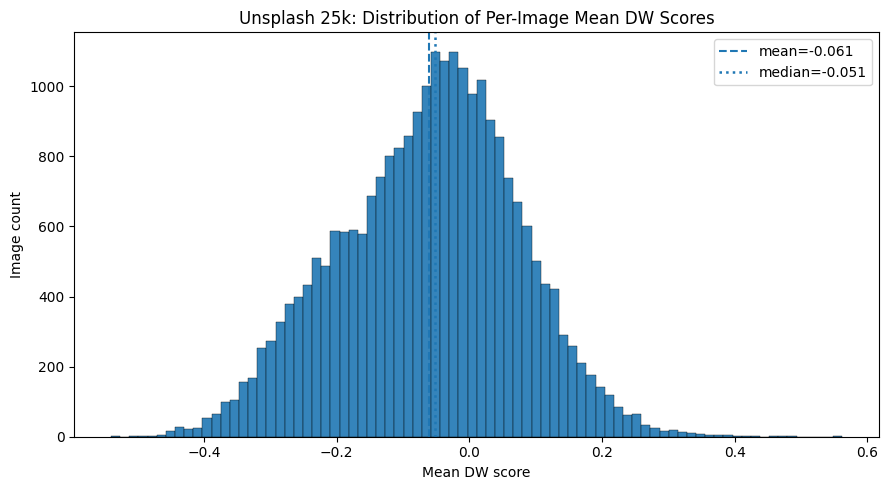

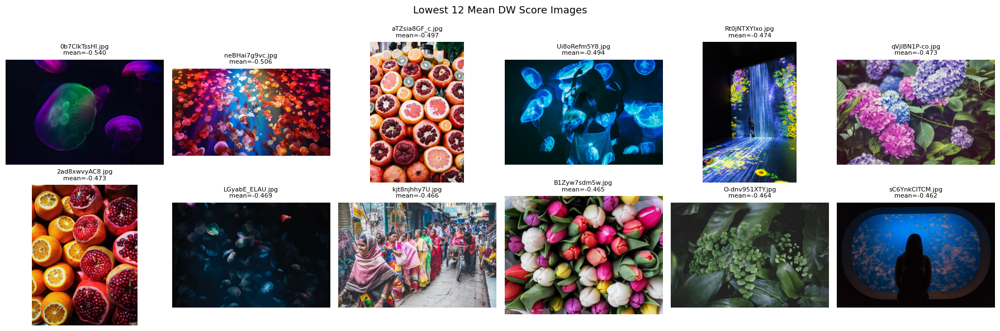

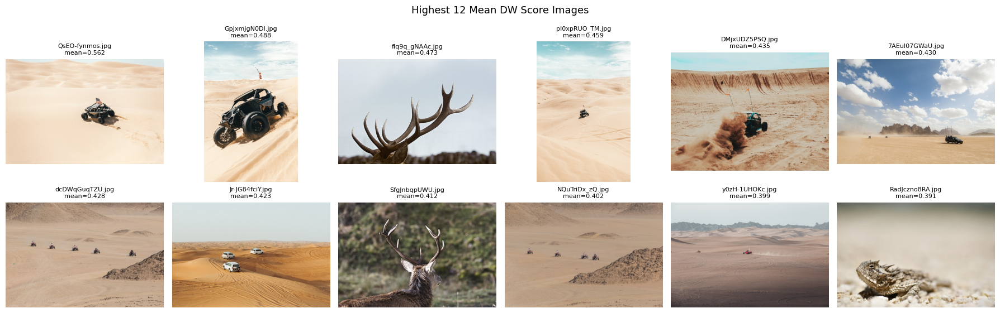

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Paths
csv_path = Path("results/qwen3-vl-8b-instruct/unsplash25k_patch_stats.csv")
out_dir = Path("results/qwen3-vl-8b-instruct")

if not csv_path.exists():
    raise FileNotFoundError(f"Could not find stats CSV: {csv_path}")

# Load and clean
stats = pd.read_csv(csv_path)
if "mean" not in stats.columns:
    raise ValueError(f"Expected a 'mean' column in {csv_path}, found: {list(stats.columns)}")

stats = stats.copy()
stats["mean"] = pd.to_numeric(stats["mean"], errors="coerce")
stats = stats.dropna(subset=["mean"]).reset_index(drop=True)

if stats.empty:
    raise ValueError("No valid rows with numeric 'mean' scores were found.")

# Basic summary
print(f"Rows: {len(stats):,}")
print("\nMean score summary:")
print(stats["mean"].describe(percentiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]))

# Distribution of mean DW score
fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(stats["mean"], bins=80, alpha=0.9, edgecolor="black", linewidth=0.3)
ax.axvline(stats["mean"].mean(), linestyle="--", linewidth=1.5, label=f"mean={stats['mean'].mean():.3f}")
ax.axvline(stats["mean"].median(), linestyle=":", linewidth=1.8, label=f"median={stats['mean'].median():.3f}")
ax.set_title("Unsplash 25k: Distribution of Per-Image Mean DW Scores")
ax.set_xlabel("Mean DW score")
ax.set_ylabel("Image count")
ax.legend()
plt.tight_layout()
plt.show()

# Optional: relationship with patch count (if available)
if "n_patches" in stats.columns:
    fig, ax = plt.subplots(figsize=(7.5, 5))
    ax.scatter(stats["n_patches"], stats["mean"], s=8, alpha=0.35)
    ax.set_title("Mean DW Score vs Patch Count")
    ax.set_xlabel("Number of image patches")
    ax.set_ylabel("Mean DW score")
    plt.tight_layout()
    plt.show()

# Choose image path column
path_col = "image_path" if "image_path" in stats.columns else None
if path_col is None and "image_name" in stats.columns:
    candidate = Path("data/unsplash")
    if candidate.exists():
        path_col = "image_name"

if path_col is None:
    print("\nCould not find 'image_path' or usable 'image_name' column for image previews.")
else:
    def _resolve_path(row):
        if path_col == "image_path":
            return Path(row["image_path"])
        return Path("data/unsplash") / str(row["image_name"])

    def show_extremes(df: pd.DataFrame, n: int = 12):
        low = df.nsmallest(n, "mean").copy()
        high = df.nlargest(n, "mean").copy()

        def _plot_group(group, title):
            cols = 6
            rows = int(np.ceil(len(group) / cols))
            fig, axes = plt.subplots(rows, cols, figsize=(3.0 * cols, 3.0 * rows))
            axes = np.atleast_1d(axes).flatten()

            for ax, (_, r) in zip(axes, group.iterrows()):
                img_path = _resolve_path(r)
                if not img_path.exists():
                    ax.set_title(f"Missing\n{img_path.name}\nmean={r['mean']:.3f}", fontsize=8)
                    ax.axis("off")
                    continue

                try:
                    img = Image.open(img_path).convert("RGB")
                    ax.imshow(img)
                    label = r.get("image_name", img_path.name)
                    ax.set_title(f"{label}\nmean={r['mean']:.3f}", fontsize=8)
                except Exception as e:
                    ax.set_title(f"Error\n{img_path.name}\n{type(e).__name__}", fontsize=8)
                ax.axis("off")

            for ax in axes[len(group):]:
                ax.axis("off")

            fig.suptitle(title, fontsize=13)
            plt.tight_layout()
            plt.show()

        _plot_group(low, f"Lowest {n} Mean DW Score Images")
        _plot_group(high, f"Highest {n} Mean DW Score Images")

    show_extremes(stats, n=12)


## Unsplash 25k Embedding Clusters + t-SNE

This section loads image embeddings from `data/unsplash-25k-photos-embeddings.pkl`, clusters images into coarse topics, and plots a 2D t-SNE map where marker shape denotes cluster/topic and color denotes mean DW score.

In [2]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

emb_path = Path("data/unsplash-25k-photos-embeddings.pkl")
stats_path = Path("results/qwen3-vl-8b-instruct/unsplash25k_patch_stats.csv")

if not emb_path.exists():
    raise FileNotFoundError(f"Missing embeddings file: {emb_path}")
if not stats_path.exists():
    raise FileNotFoundError(f"Missing DW stats CSV: {stats_path}")


def _coerce_embeddings_table(obj) -> pd.DataFrame:
    if isinstance(obj, pd.DataFrame):
        df = obj.copy()

        if "embedding" in df.columns:
            return df

        numeric_cols = [c for c in df.columns if pd.api.types.is_numeric_dtype(df[c])]
        if len(numeric_cols) >= 8:
            id_cols = [c for c in df.columns if c not in numeric_cols]
            if id_cols:
                id_col = id_cols[0]
                out = pd.DataFrame({
                    "image_name": df[id_col].astype(str),
                    "embedding": list(df[numeric_cols].to_numpy(dtype=np.float32)),
                })
            else:
                out = pd.DataFrame({
                    "image_name": df.index.astype(str),
                    "embedding": list(df[numeric_cols].to_numpy(dtype=np.float32)),
                })
            return out

        raise ValueError("Embeddings DataFrame does not contain an 'embedding' column or numeric embedding columns.")

    if isinstance(obj, dict):
        if "embeddings" not in obj:
            raise ValueError("Embeddings dict must include an 'embeddings' key.")

        emb = np.asarray(obj["embeddings"])
        if emb.ndim == 1 and len(emb) > 0 and isinstance(emb[0], (list, np.ndarray)):
            emb = np.vstack(obj["embeddings"])

        out = pd.DataFrame({"embedding": list(emb)})

        for key in ["image_path", "image_name", "paths", "image_paths", "filenames", "files"]:
            if key in obj and len(obj[key]) == len(out):
                out[key] = [str(x) for x in obj[key]]
                break

        if "image_name" not in out.columns:
            if "image_path" in out.columns:
                out["image_name"] = out["image_path"].map(lambda p: Path(p).name)
            else:
                out["image_name"] = [f"img_{i:05d}" for i in range(len(out))]

        return out

    if isinstance(obj, (tuple, list)) and len(obj) == 2:
        maybe_paths, maybe_emb = obj
        emb = np.asarray(maybe_emb)
        out = pd.DataFrame({"embedding": list(emb)})
        if len(maybe_paths) == len(out):
            out["image_path"] = [str(x) for x in maybe_paths]
            out["image_name"] = out["image_path"].map(lambda p: Path(p).name)
        return out

    raise TypeError(f"Unsupported embeddings object type: {type(obj).__name__}")


raw_obj = pd.read_pickle(emb_path)
emb_df = _coerce_embeddings_table(raw_obj)

if "image_name" not in emb_df.columns:
    if "image_path" in emb_df.columns:
        emb_df["image_name"] = emb_df["image_path"].map(lambda p: Path(p).name)
    else:
        emb_df["image_name"] = [f"img_{i:05d}" for i in range(len(emb_df))]

stats = pd.read_csv(stats_path)
if "mean" not in stats.columns:
    raise ValueError(f"Expected a 'mean' column in {stats_path}, found: {list(stats.columns)}")

stats = stats.copy()
stats["mean"] = pd.to_numeric(stats["mean"], errors="coerce")
stats = stats.dropna(subset=["mean"]) 

if "image_name" not in stats.columns:
    if "image_path" in stats.columns:
        stats["image_name"] = stats["image_path"].map(lambda p: Path(str(p)).name)
    else:
        raise ValueError("Stats CSV must include either 'image_name' or 'image_path'.")

merged = emb_df.merge(
    stats[["image_name", "mean"] + (["n_patches"] if "n_patches" in stats.columns else [])],
    on="image_name",
    how="inner",
)

if merged.empty:
    raise ValueError("No overlap between embeddings and stats. Check naming of image_name/image_path.")

X = np.vstack(merged["embedding"].to_numpy())
if X.ndim != 2:
    raise ValueError(f"Expected 2D embeddings array, got shape {X.shape}")

# Clustering as coarse topics
n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init="auto")
merged["cluster"] = kmeans.fit_predict(X)

# 2D t-SNE projection
perplexity = min(30, max(5, (len(merged) - 1) // 3))
tsne = TSNE(
    n_components=2,
    random_state=42,
    init="pca",
    learning_rate="auto",
    perplexity=perplexity,
)
XY = tsne.fit_transform(X)
merged["tsne_x"] = XY[:, 0]
merged["tsne_y"] = XY[:, 1]

print(f"Rows used for clustering/t-SNE: {len(merged):,}")
print(f"Embedding dim: {X.shape[1]}")
print(f"Perplexity used: {perplexity}")

Rows used for clustering/t-SNE: 24,996
Embedding dim: 512
Perplexity used: 30


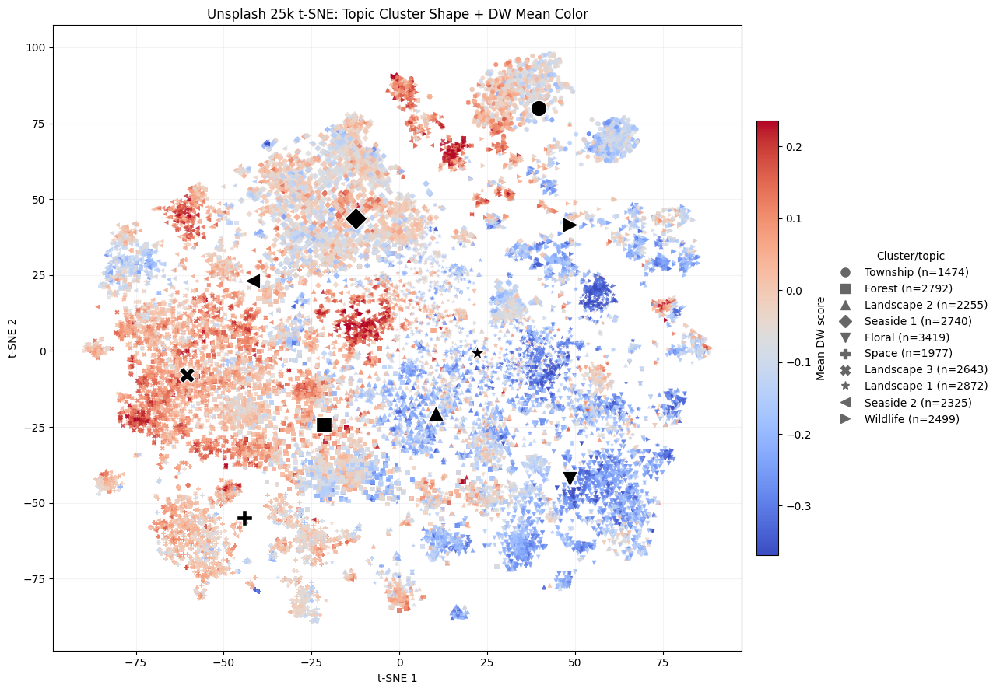

In [3]:
from matplotlib.lines import Line2D

markers = ["o", "s", "^", "D", "v", "P", "X", "*", "<", ">", "h", "8"]
cluster_ids = sorted(merged["cluster"].unique())
marker_map = {cid: markers[i % len(markers)] for i, cid in enumerate(cluster_ids)}
cluster_label_map = {
    0: "Township",
    1: "Forest",
    2: "Landscape 2",
    3: "Seaside 1",
    4: "Floral",
    5: "Space",
    6: "Landscape 3",
    7: "Landscape 1",
    8: "Seaside 2",
    9: "Wildlife",
}

vmin = merged["mean"].quantile(0.01)
vmax = merged["mean"].quantile(0.99)
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = "coolwarm"

fig, ax = plt.subplots(figsize=(13, 9))
for cid in cluster_ids:
    sub = merged[merged["cluster"] == cid]
    ax.scatter(
        sub["tsne_x"],
        sub["tsne_y"],
        c=sub["mean"],
        cmap=cmap,
        norm=norm,
        s=18,
        alpha=0.8,
        marker=marker_map[cid],
        linewidths=0,
    )

    centroid_x = sub["tsne_x"].mean()
    centroid_y = sub["tsne_y"].mean()
    ax.scatter(
        centroid_x,
        centroid_y,
        marker=marker_map[cid],
        c="black",
        s=220,
        edgecolors="white",
        linewidths=1.0,
        zorder=6,
    )

legend_handles = [
    Line2D(
        [0],
        [0],
        marker=marker_map[cid],
        color="none",
        markerfacecolor="#666666",
        markeredgecolor="#666666",
        markersize=8,
        linestyle="None",
        label=f"{cluster_label_map.get(cid, f'Cluster {cid}')} (n={(merged['cluster'] == cid).sum()})",
    )
    for cid in cluster_ids
]

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Mean DW score")

ax.set_title("Unsplash 25k t-SNE: Topic Cluster Shape + DW Mean Color")
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.grid(alpha=0.15)
ax.legend(
    handles=legend_handles,
    loc="center left",
    bbox_to_anchor=(1.12, 0.5),
    frameon=False,
    title="Cluster/topic",
)
plt.tight_layout()
plt.show()

Explained variance ratio: PC1=0.082, PC2=0.065


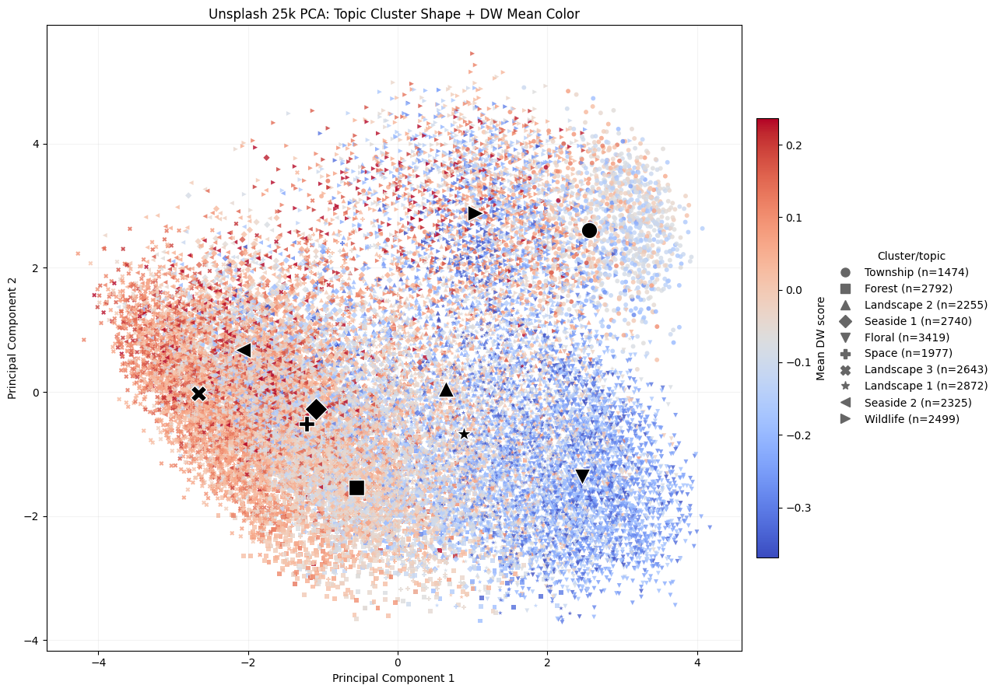

In [4]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA

if "merged" not in globals() or "embedding" not in merged.columns:
    raise RuntimeError("Run the clustering/t-SNE preparation cell first so `merged` contains embeddings and clusters.")

X_pca = np.vstack(merged["embedding"].to_numpy())
pca = PCA(n_components=2)
XY_pca = pca.fit_transform(X_pca)
merged["pca_x"] = XY_pca[:, 0]
merged["pca_y"] = XY_pca[:, 1]

print(
    f"Explained variance ratio: PC1={pca.explained_variance_ratio_[0]:.3f}, "
    f"PC2={pca.explained_variance_ratio_[1]:.3f}"
)

markers = ["o", "s", "^", "D", "v", "P", "X", "*", "<", ">", "h", "8"]
cluster_ids = sorted(merged["cluster"].unique())
marker_map = {cid: markers[i % len(markers)] for i, cid in enumerate(cluster_ids)}
cluster_label_map = {
    0: "Township",
    1: "Forest",
    2: "Landscape 2",
    3: "Seaside 1",
    4: "Floral",
    5: "Space",
    6: "Landscape 3",
    7: "Landscape 1",
    8: "Seaside 2",
    9: "Wildlife",
}

vmin = merged["mean"].quantile(0.01)
vmax = merged["mean"].quantile(0.99)
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = "coolwarm"

fig, ax = plt.subplots(figsize=(13, 9))
for cid in cluster_ids:
    sub = merged[merged["cluster"] == cid]
    ax.scatter(
        sub["pca_x"],
        sub["pca_y"],
        c=sub["mean"],
        cmap=cmap,
        norm=norm,
        s=18,
        alpha=0.8,
        marker=marker_map[cid],
        linewidths=0,
    )

    centroid_x = sub["pca_x"].mean()
    centroid_y = sub["pca_y"].mean()
    ax.scatter(
        centroid_x,
        centroid_y,
        marker=marker_map[cid],
        c="black",
        s=220,
        edgecolors="white",
        linewidths=1.0,
        zorder=6,
    )

legend_handles = [
    Line2D(
        [0],
        [0],
        marker=marker_map[cid],
        color="none",
        markerfacecolor="#666666",
        markeredgecolor="#666666",
        markersize=8,
        linestyle="None",
        label=f"{cluster_label_map.get(cid, f'Cluster {cid}')} (n={(merged['cluster'] == cid).sum()})",
    )
    for cid in cluster_ids
]

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
cbar.set_label("Mean DW score")

ax.set_title("Unsplash 25k PCA: Topic Cluster Shape + DW Mean Color")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.grid(alpha=0.15)
ax.legend(
    handles=legend_handles,
    loc="center left",
    bbox_to_anchor=(1.12, 0.5),
    frameon=False,
    title="Cluster/topic",
)
plt.tight_layout()
plt.show()

In [5]:
cluster_summary = (
    merged.groupby("cluster", as_index=False)
    .agg(
        n_images=("image_name", "count"),
        mean_dw=("mean", "mean"),
        median_dw=("mean", "median"),
        std_dw=("mean", "std"),
    )
    .sort_values("mean_dw")
)

print("\nCluster DW summary:")
display(cluster_summary)


Cluster DW summary:


,cluster,n_images,mean_dw,median_dw,std_dw
4,4,3419,-0.190501,-0.200317,0.100198
7,7,2872,-0.130541,-0.119744,0.136355
2,2,2255,-0.124085,-0.134875,0.117848
9,9,2499,-0.065444,-0.077061,0.161590
3,3,2740,-0.048311,-0.046999,0.076415
0,0,1474,-0.045021,-0.052881,0.097955
1,1,2792,-0.030909,-0.024360,0.098057
5,5,1977,-0.013506,-0.014579,0.066365
8,8,2325,0.030666,0.029170,0.127654
6,6,2643,0.066989,0.067507,0.076084


Saving cluster extreme figures to: results/qwen3-vl-8b-instruct/unsplash25k_cluster_extremes


### Cluster 4 Images: 3,419 | Mean DW: -0.1905 | Median DW: -0.2003

Saved cluster_04_dw_extremes.png


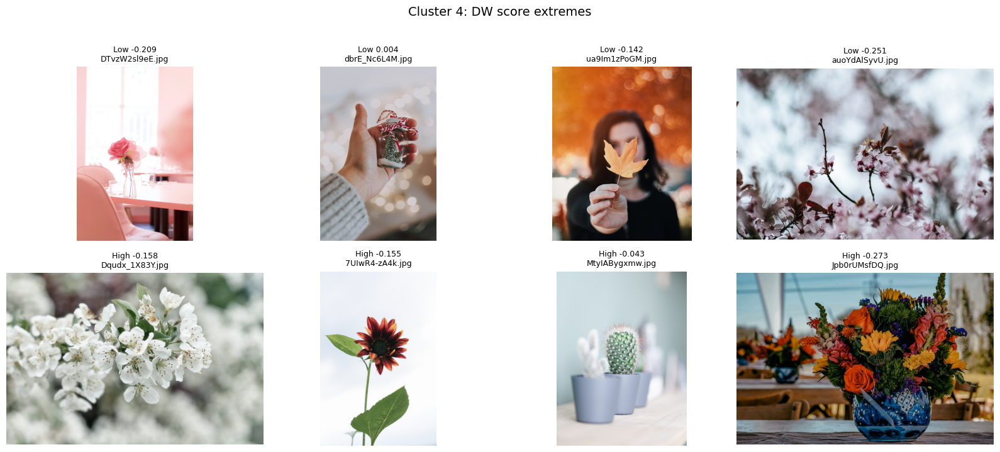

### Cluster 7 Images: 2,872 | Mean DW: -0.1305 | Median DW: -0.1197

Saved cluster_07_dw_extremes.png


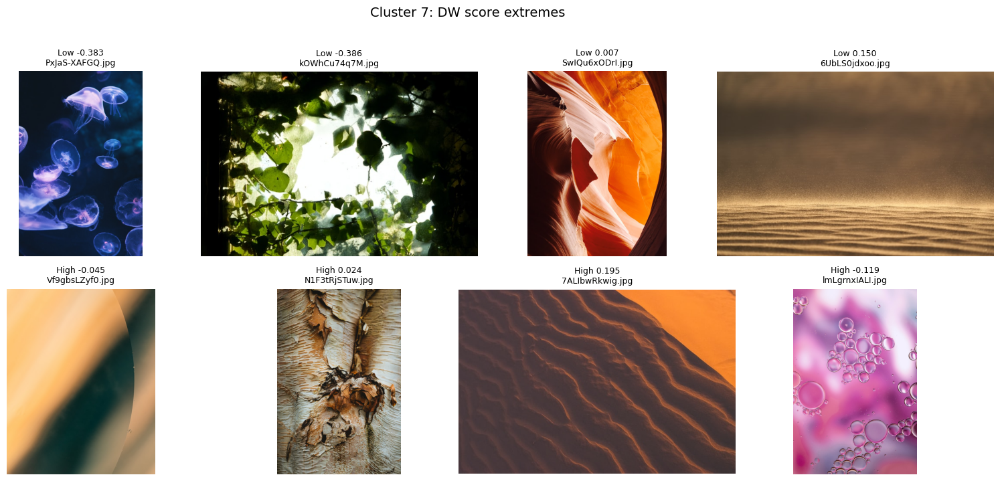

### Cluster 2 Images: 2,255 | Mean DW: -0.1241 | Median DW: -0.1349

Saved cluster_02_dw_extremes.png


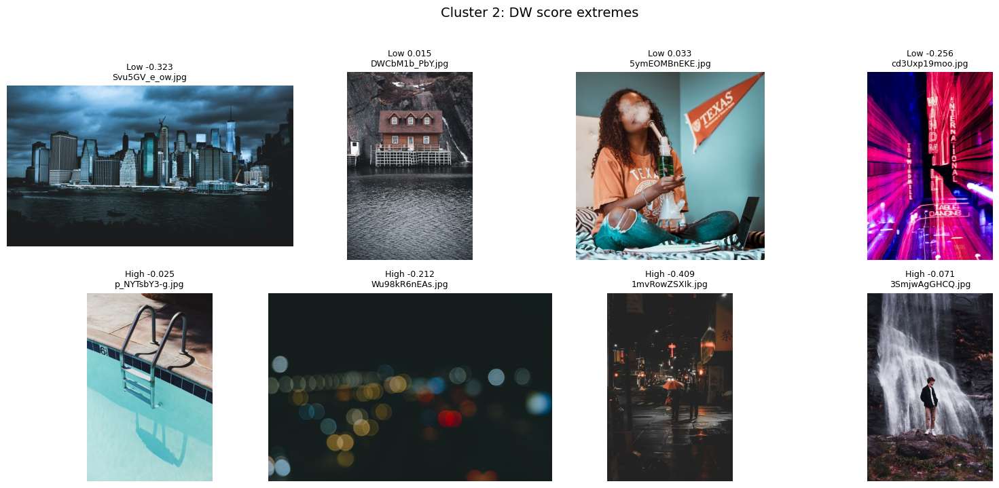

### Cluster 9 Images: 2,499 | Mean DW: -0.0654 | Median DW: -0.0771

Saved cluster_09_dw_extremes.png


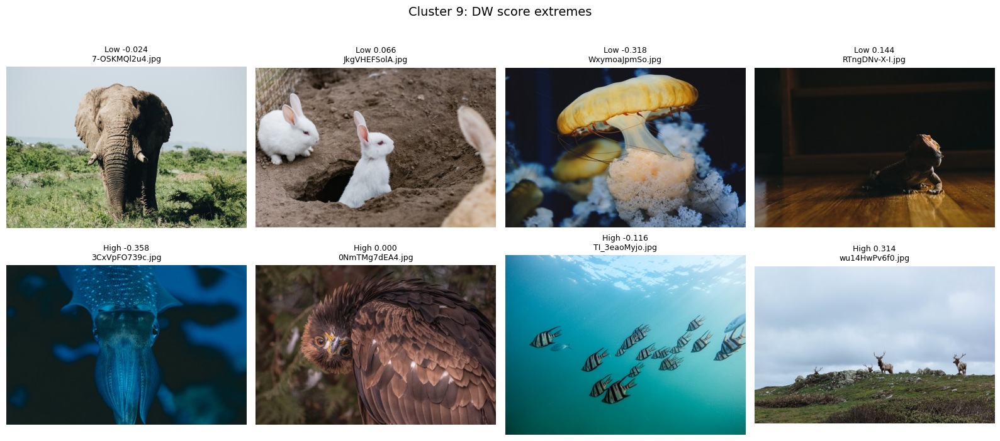

### Cluster 3 Images: 2,740 | Mean DW: -0.0483 | Median DW: -0.0470

Saved cluster_03_dw_extremes.png


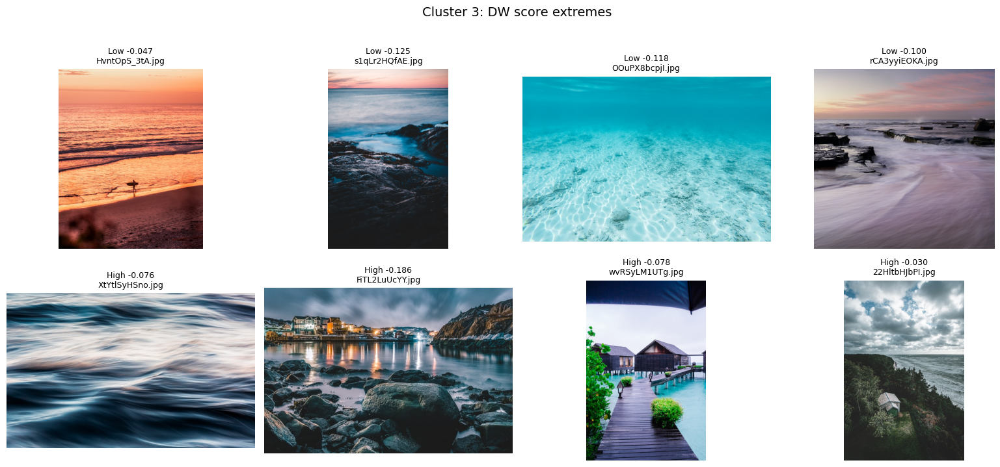

### Cluster 0 Images: 1,474 | Mean DW: -0.0450 | Median DW: -0.0529

Saved cluster_00_dw_extremes.png


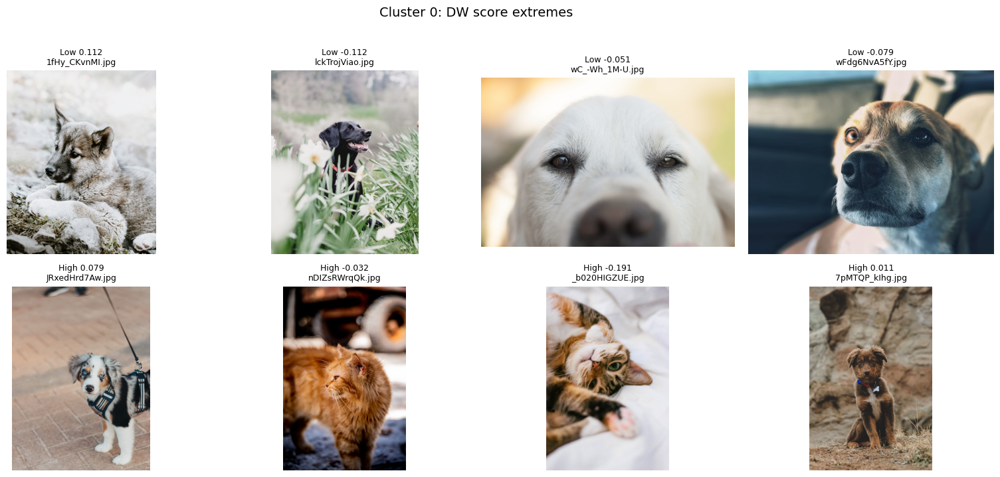

### Cluster 1 Images: 2,792 | Mean DW: -0.0309 | Median DW: -0.0244

Saved cluster_01_dw_extremes.png


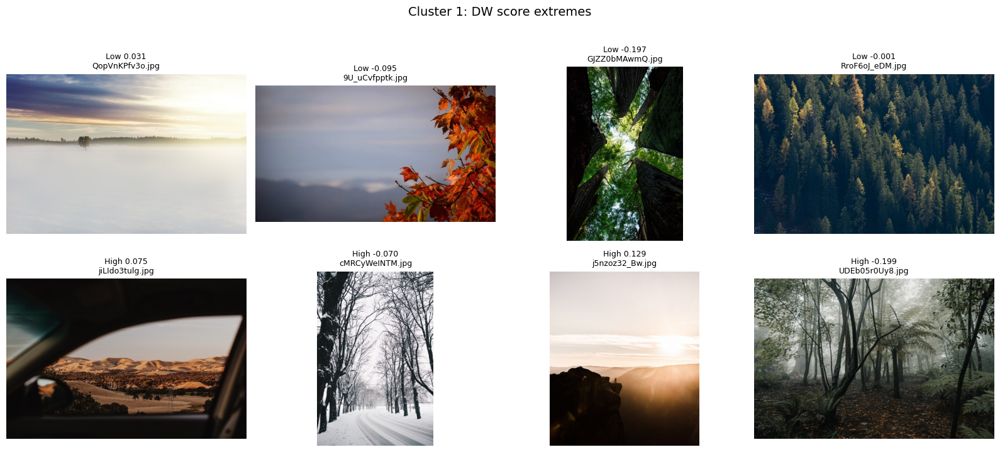

### Cluster 5 Images: 1,977 | Mean DW: -0.0135 | Median DW: -0.0146

Saved cluster_05_dw_extremes.png


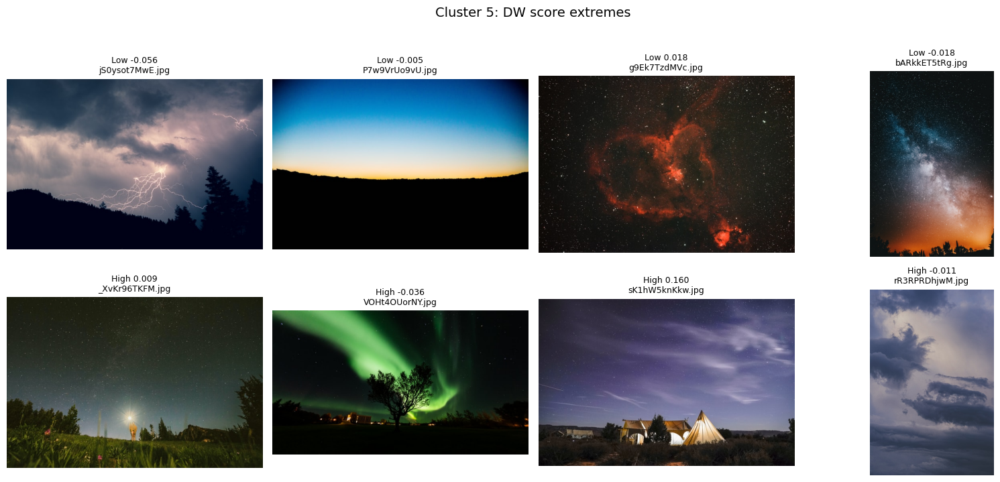

### Cluster 8 Images: 2,325 | Mean DW: 0.0307 | Median DW: 0.0292

Saved cluster_08_dw_extremes.png


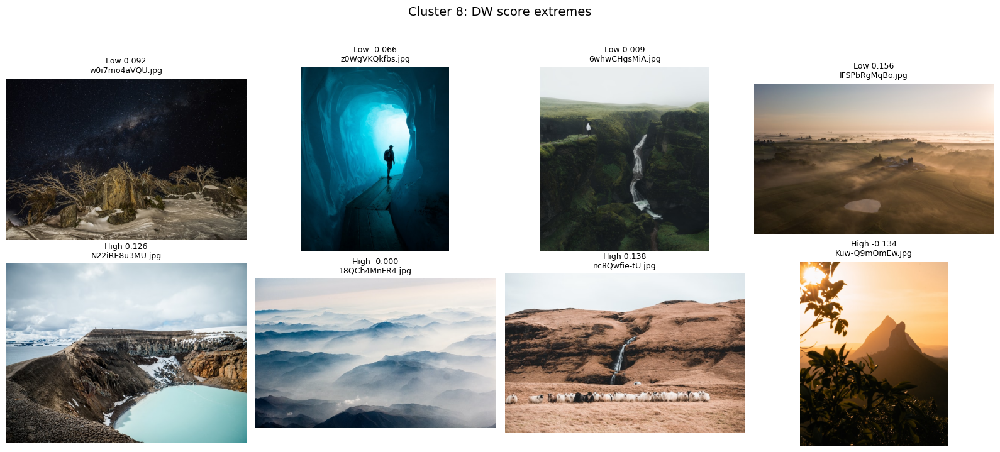

### Cluster 6 Images: 2,643 | Mean DW: 0.0670 | Median DW: 0.0675

Saved cluster_06_dw_extremes.png


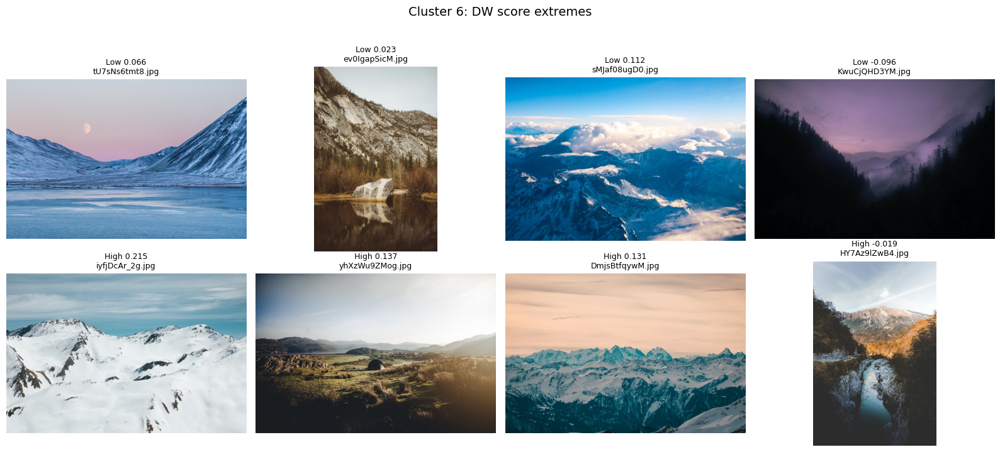

: 

In [ ]:
from pathlib import Path

from IPython.display import Markdown, display
from PIL import Image

n_examples_per_side = 4
repo_root = stats_path.resolve().parents[2]
fallback_image_dir = repo_root / "data/unsplash"
fig_dir = stats_path.parent / "unsplash25k_cluster_extremes"
fig_dir.mkdir(parents=True, exist_ok=True)

if "merged" not in globals():
    raise RuntimeError("Run the clustering cell first so `merged` is available.")

viz_df = merged.copy()
stats_lookup = None
if "stats" in globals() and {"image_name", "image_path"}.issubset(stats.columns):
    stats_lookup = stats[["image_name", "image_path"]].drop_duplicates().rename(
        columns={"image_path": "stats_image_path"}
    )
    viz_df = viz_df.merge(stats_lookup, on="image_name", how="left")

if "image_path" not in viz_df.columns:
    viz_df["image_path"] = ""

viz_df["image_path"] = viz_df["image_path"].fillna("").map(str)
if "stats_image_path" in viz_df.columns:
    viz_df["stats_image_path"] = viz_df["stats_image_path"].fillna("").map(str)
else:
    viz_df["stats_image_path"] = ""


def _resolve_candidate(path_str: str) -> Path | None:
    if not path_str:
        return None
    candidate = Path(path_str)
    if candidate.is_absolute():
        return candidate
    return repo_root / candidate


resolved_paths = []
for _, row in viz_df.iterrows():
    candidates = [
        _resolve_candidate(row["stats_image_path"]),
        _resolve_candidate(row["image_path"]),
        fallback_image_dir / row["image_name"],
    ]
    existing = next((path for path in candidates if path is not None and path.exists()), None)
    resolved_paths.append(existing or candidates[-1])

viz_df["resolved_image_path"] = resolved_paths
viz_df["image_exists"] = viz_df["resolved_image_path"].map(Path.exists)

missing_count = int((~viz_df["image_exists"]).sum())
if missing_count:
    print(f"Warning: {missing_count} images could not be found on disk and will be skipped where necessary.")

print(f"Saving cluster extreme figures to: {fig_dir}")

cluster_order = (
    viz_df.groupby("cluster")["mean"]
    .mean()
    .sort_values()
    .index
    .tolist()
)


def _draw_image(ax, image_path: Path, title: str) -> None:
    ax.axis("off")
    if not image_path.exists():
        ax.text(0.5, 0.5, "missing", ha="center", va="center", fontsize=10)
        ax.set_title(title, fontsize=9)
        return

    with Image.open(image_path) as img:
        ax.imshow(img.convert("RGB"))
    ax.set_title(title, fontsize=9)


for cid in cluster_order:
    cluster_df = viz_df[viz_df["cluster"] == cid].sort_values("mean")
    lowest = cluster_df[cluster_df["image_exists"]].sample(n_examples_per_side)
    highest = cluster_df[cluster_df["image_exists"]].sample(n_examples_per_side)

    cluster_mean = cluster_df["mean"].mean()
    cluster_median = cluster_df["mean"].median()
    display(
        Markdown(
            f"### Cluster {cid} "
            f"Images: {len(cluster_df):,} | "
            f"Mean DW: {cluster_mean:.4f} | Median DW: {cluster_median:.4f}"
        )
    )

    fig, axes = plt.subplots(2, n_examples_per_side, figsize=(4 * n_examples_per_side, 7))
    if n_examples_per_side == 1:
        axes = np.array(axes).reshape(2, 1)

    for ax, (_, row) in zip(axes[0], lowest.iterrows()):
        _draw_image(
            ax,
            row["resolved_image_path"],
            f"Low {row['mean']:.3f}\n{row['image_name']}",
        )
    for ax in axes[0][len(lowest):]:
        ax.axis("off")

    for ax, (_, row) in zip(axes[1], highest.iterrows()):
        _draw_image(
            ax,
            row["resolved_image_path"],
            f"High {row['mean']:.3f}\n{row['image_name']}",
        )
    for ax in axes[1][len(highest):]:
        ax.axis("off")

    axes[0, 0].set_ylabel("Lowest DW", fontsize=11)
    axes[1, 0].set_ylabel("Highest DW", fontsize=11)
    fig.suptitle(f"Cluster {cid}: DW score extremes", fontsize=14, y=1.02)
    fig.tight_layout()

    out_path = fig_dir / f"cluster_{cid:02d}_dw_extremes.png"
    fig.savefig(out_path, dpi=200, bbox_inches="tight")
    print(f"Saved {out_path.name}")

    plt.show()